Задача №15 Алгоритм прогнозирования выработки 
объекта генерации возобновляемой энергетики
(Росэнергоатом) 
1.1 Актуальность задачи
Возобновляемая энергетика по цене производства киловатт-часа 
становится выгоднее традиционной – работающей за счет сжигания 
ископаемого топлива. Одним из препятствий для широкого внедрения 
объектов ВИЭ является зависимость их выработки от метеорологических 
условий и связанные с этим сложности прогнозирования. Точный план 
выработки объекта генерации ВИЭ позволяет снизить объем 
дополнительных резервов, размещаемых на топливных электростанциях, и 
оптимизировать системные издержки на энергоснабжение всех 
потребителей.
1.2 Описание задачи.
Алгоритм на вход получает:
▪ любые доступные данные влияющие на функционирования 
объекта генерации ВИЭ (например, https://meteoinfo.ru/archive-pogoda/russia) 
▪ фактические почасовые данные выработки конкретной 
ветроэлектростанции (dataset предоставляется организатором);
▪ любые доступные метеорологические прогнозы (например, 
https://meteoinfo.ru/forecasts)
и формирует почасовой прогноз выработки на горизонте 
метеорологического прогноза (не менее трех суток). 
1.3 Оценка работоспособности.
Эксперты анализируют результативность прогноза (точность):
• Без поправки на фактические метеоданные за истекшие сутки
• С поправкой на фактические метеоданные
1.4 Требования к разработке
Разработка – предпочтительно в python
MVP на ваш выбор, предпочтительно фронт react
1.5 Критерии оценки
1. Работоспособность
2. Результативность (точность)
3. UX/UI
4. Выступление и презентация

In [1]:
pip install fake-useragent

Note: you may need to restart the kernel to use updated packages.


In [1]:
import asyncio
import aiohttp
from bs4 import BeautifulSoup as BS
from fake_useragent import UserAgent

In [2]:
import json
import os
import random
import re
import time
import requests
from bs4 import BeautifulSoup
import pandas as pd


In [6]:
def get_data(url):
    
    headers = {"User-Agent": UserAgent().random}
    req = requests.get(url, headers)
    soup = BeautifulSoup(req.text, "lxml")
    days = soup.find_all("td",class_="climate-calendar__cell")
    l_days, l_h_T, l_l_T, l_precipitation = [],[],[],[]
    for d in days:
        st = (d.find("span",class_="a11y-hidden").text).split(";")
        l_precipitation.append(st[-1])
        l_days.append(st[0].split(",")[0])
        l_h_T.append(st[0].split(",")[-1])
        l_l_T.append(st[1].split(",")[1])
    df = pd.DataFrame({'day': l_days,
     'day T': l_h_T,
     'night T': l_l_T,
                       'precipitation':l_precipitation
    })
    return df
    
    
    


In [7]:
df = get_data("https://yandex.ru/pogoda/month/december?lat=55.646038&lon=37.650527&via=cnav")

In [8]:
df = get_data("https://yandex.ru/pogoda/month/december?lat=55.646038&lon=37.650527&via=cnav")
base=[]
for i in ['december','january', 'february','march', 'april', 'may','september','october', 'november', 'june', 'july', 'august' ]:
    df1 = (get_data(f"https://yandex.ru/pogoda/month/{i}?lat=55.646038&lon=37.650527&via=cnav"))
    base.append(df1)
df = pd.concat(base)

In [9]:
df = df.drop_duplicates() 

In [10]:
df["day T"]=df["day T"].apply(lambda x:int(x[:-1]))
df["night T"]=df["night T"].apply(lambda x:int(x[:-1]))

<Axes: xlabel='day', ylabel='day T'>

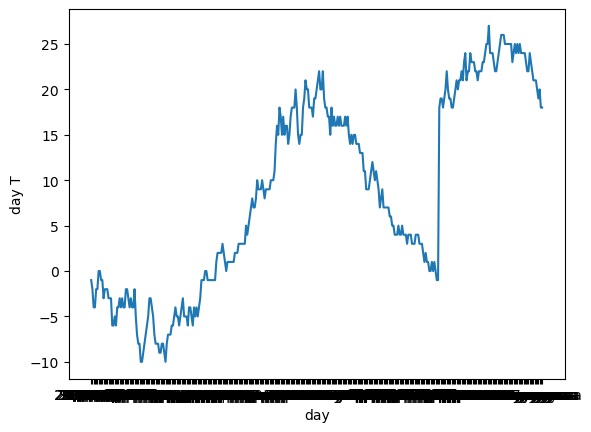

In [11]:
import seaborn as sns
sns.lineplot( x ='day', y = 'day T', data=df )

In [1]:
import numpy as np # linear algebra

import matplotlib.pyplot as plt #Plotting
%matplotlib inline

import seaborn as sns
import statsmodels.api as sm


from statsmodels.tsa.stattools import adfuller #Check if data is stationary
from statsmodels.graphics.tsaplots import plot_acf #Compute lag for ARIMA
from statsmodels.graphics.tsaplots import plot_pacf #Compute partial lag for ARIMA
from statsmodels.tsa.arima.model import ARIMA #Predictions and Forecasting

In [5]:
companies = ["TenneTTSO"]
dataframeHolder = []
for comp in companies:
    compPath = comp + ".csv" #Build the path to the CSV
    compDF = pd.read_csv(compPath) #Read the CSV for the company
    dataframeHolder.append(compDF) #Put the company CSV into the dataframe holder
    
dataframeHolder[0].head() 


,Date,00:00:00,00:15:00,00:30:00,00:45:00,01:00:00,01:15:00,01:30:00,01:45:00,02:00:00,...,21:30:00,21:45:00,22:00:00,22:15:00,22:30:00,22:45:00,23:00:00,23:15:00,23:30:00,23:45:00
0,23/08/2019,9.68,10.16,10.94,11.39,12.09,12.79,13.33,13.88,14.73,...,73.52,74.03,74.77,73.32,74.83,73.10,71.26,71.95,69.97,69.58
1,24/08/2019,67.94,67.52,64.48,64.78,65.75,65.07,63.39,63.69,64.37,...,116.79,114.30,110.81,109.76,106.55,102.31,99.04,96.57,94.75,91.73
2,25/08/2019,89.38,88.95,85.13,82.74,81.46,77.92,75.58,72.94,70.41,...,50.02,48.04,45.45,43.04,41.25,39.36,37.60,35.46,34.00,33.47
3,26/08/2019,33.71,31.84,32.75,33.33,32.02,30.97,29.97,28.47,25.92,...,71.72,69.34,67.46,65.91,64.29,62.16,57.53,58.15,55.76,54.34
4,27/08/2019,52.65,47.95,44.61,43.80,41.00,41.23,41.07,39.49,36.93,...,54.66,54.82,55.75,54.94,56.00,56.02,55.51,55.96,56.48,55.19


In [6]:
def meltComp(compDF, comp):
    df = pd.melt(compDF, id_vars = ["Date"], var_name = "Time", value_name = comp) #Melt the dataframe by date and time
    df["dateTime"] = df["Date"] + " " +df["Time"] #Create a combined datetime column
    df["dateTime"] = pd.to_datetime(df["dateTime"]) #Turn the datetime column into a datetime type

    df = df.drop(columns = {"Date", "Time"}) #Drop the date and time columns (they are now redundant)
    df = df.set_index("dateTime") #Set the index to the new dateTime column
    df = df.sort_index() #Sort them based on index so that the dates are grouped together
    df.reset_index(drop = False, inplace = True) #Reset the index
    return df #Return the new dataframe

In [7]:
meltDF = [] #Create another holder for melted dataframes
compIterator = 0 #Create an iterator for the company names

#For each company dataframe, melt it down. We want the times to be rows, not columns.
for compDF in dataframeHolder:
    meltDF.append(meltComp(compDF, companies[compIterator])) #Melt the company dataframe and add it to the melted dataframe holder
    compIterator += 1 #Increase the company name iterator

meltDF[0]

,dateTime,TenneTTSO
0,2019-01-09 00:00:00,100.52
1,2019-01-09 00:15:00,85.97
2,2019-01-09 00:30:00,77.25
3,2019-01-09 00:45:00,68.23
4,2019-01-09 01:00:00,62.82
...,...,...
38107,2020-12-09 22:45:00,45.94
38108,2020-12-09 23:00:00,49.41
38109,2020-12-09 23:15:00,46.19
38110,2020-12-09 23:30:00,44.97


In [8]:
mainDF = meltDF[0] #Get the first DF as the one to merge on
meltLength = len(meltDF) #Get the number of melted dataframe

#For each company in meltDF, merge the dataframe with the main one (start at 1 to ignore the original main one)
for company in range(1, meltLength):
    mainDF = mainDF.merge(meltDF[company], on = "dateTime") #Merge the company dataframes with the main one

mainDF['time'] = mainDF['dateTime'].apply(lambda x: x.time())
mainDF['dateTime'] = mainDF['dateTime'].apply(lambda x: str(x.date()))

In [38]:
df = pd.DataFrame(columns=['date','energy'])
l_d, l_e=[],[]
for i in mainDF['dateTime'].values:
    m = mainDF[mainDF['dateTime']==i]['TenneTTSO'].sum()
    l_d.append(i)
    l_e.append(m/96)
df['date']=l_d
df['energy']=l_e

In [50]:
df.drop_duplicates()
df['dateTime']=df['date']
df.drop('date', axis=1, inplace=True)

In [3]:
def get_data_forecast(url):
    
    headers = {"User-Agent": UserAgent().random}
    req = requests.get(url, headers)
    soup = BeautifulSoup(req.text, "lxml")
    days = soup.find_all("div",class_="day day_calendar")
    l_days, l_h_T, l_l_T, l_precipitation,l_press,l_hum, l_wind = [],[],[],[],[],[],[]
    for d in days:
        l_precipitation.append(d.find("div",class_="day__description").find("span").text)
        l_days.append(d.find("div", class_="day__date").text)
        l_h_T.append(d.find("div",class_="day__temperature").text.split("\n")[0])
        l_l_T.append(d.find("span",class_="day__temperature__night").text)
        days_add=d.find_all("div",class_="day__additional")
        l_press.append(days_add[0].find("span").text.split("\n")[1])
        l_hum.append(days_add[1].find("span").text.split("\n")[1])
        l_wind.append(days_add[2].find("span").text.split("\n")[1])
    df = pd.DataFrame({'dateTime': l_days,
     'day T': l_h_T,
     'night T': l_l_T,
                       'precipitation':l_precipitation, 
                       'pressure':l_press,
                       'huminity':l_hum,
                       'wind':l_wind
    })
    return df

In [90]:
data = get_data_forecast("https://pogoda.mail.ru/prognoz/braunschweig/january-2019/")
base=[]
for i in ['december','january', 'february','march', 'april', 'may','september','october', 'november', 'june', 'july', 'august' ]:
    for y in ['2019','2020']:
        df1 = (get_data_forecast(f"https://pogoda.mail.ru/prognoz/braunschweig/{i}-{y}/"))
        base.append(df1)
data = pd.concat(base)

In [10]:
df1 = (get_data_forecast(f"https://pogoda.mail.ru/prognoz/braunschweig/november-2023/"))
df1['dateTime']=df1['dateTime'].apply(convert)
df1['day T']=df1['day T'].apply(lambda x : int(x[:-1]))
df1['night T']=df1['night T'].apply(lambda x : int(x[:-1]))
df1['pressure']=df1['pressure'].apply(lambda x : int(x[:-3]))
df1['huminity']=df1['huminity'].apply(lambda x : int(x[:-1]))
df1['wind']=df1['wind'].apply(lambda x : int(x[:-4]))
df1['precipitation']=df1['precipitation'].map({"облачно": 1, "дождь":2, "ясно": 0, "дождь/гроза":4,"дождь/град":3, "осадки":3, "снег":5, "метель":6 })
df1.to_csv('datanow.csv',index=False)


In [7]:
from datetime import datetime
def convert(x):
    l = x.split()
    month = {'Января':'01','Февраля':'02','Марта':'03','Апреля':'04','Мая':'05','Июня':'06','Июля':'07','Августа':'08',
             'Сентября':'09','Октября':'10','Ноября':'11','Декабря':'12'}
    l[1]=month[l[1]]
    date1 = datetime.strptime(l[0]+' '+l[1]+' '+l[2], '%d %m %Y')
    return (date1)
data['dateTime']=data['dateTime'].apply(convert)

NameError: name 'data' is not defined

In [92]:
data['dateTime']=data['dateTime'].apply(lambda x: str(x))
data['dateTime']=data['dateTime'].apply(lambda x: x[:-9])
df['dateTime']=df['dateTime'].apply(lambda x: str(x))

In [101]:
df.drop_duplicates()

,energy,dateTime
0,90.469583,2019-01-09
96,171.260729,2019-01-10
192,154.351875,2019-01-11
288,47.354271,2019-01-12
384,74.877708,2019-02-09
...,...,...
37632,90.428333,2020-12-05
37728,94.258125,2020-12-06
37824,30.039896,2020-12-07
37920,87.709375,2020-12-08


In [94]:
DATA=data
DATA

,dateTime,day T,night T,precipitation,pressure,huminity,wind
0,2019-12-01,+4°,0°,облачно,759 мм,75%,0 м/с
1,2019-12-02,+4°,0°,осадки,759 мм,90%,5 м/с
2,2019-12-03,+6°,+1°,облачно,763 мм,87%,4 м/с
3,2019-12-04,+7°,+2°,ясно,760 мм,72%,1 м/с
4,2019-12-05,+6°,+1°,облачно,758 мм,66%,4 м/с
...,...,...,...,...,...,...,...
26,2020-08-27,+19°,+14°,дождь,753 мм,60%,6 м/с
27,2020-08-28,+21°,+13°,дождь,744 мм,61%,6 м/с
28,2020-08-29,+22°,+12°,облачно,746 мм,51%,5 м/с
29,2020-08-30,+22°,+12°,дождь,750 мм,53%,2 м/с


In [95]:
DATA = data.merge(df.drop_duplicates(),on=["dateTime"])


In [96]:
DATA['day T']=DATA['day T'].apply(lambda x : int(x[:-1]))
DATA['night T']=DATA['night T'].apply(lambda x : int(x[:-1]))
DATA['pressure']=DATA['pressure'].apply(lambda x : int(x[:-3]))
DATA['huminity']=DATA['huminity'].apply(lambda x : int(x[:-1]))
DATA['wind']=DATA['wind'].apply(lambda x : int(x[:-4]))

In [97]:
DATA['precipitation']=DATA['precipitation'].map({"облачно": 1, "дождь":2, "ясно": 0, "дождь/гроза":4,"дождь/град":3, "осадки":3, "снег":5, "метель":6 })

In [98]:
DATA

,dateTime,day T,night T,precipitation,pressure,huminity,wind,energy
0,2019-12-09,7,5,2,737,80,8,101.505729
1,2019-12-10,4,2,1,760,72,4,198.531042
2,2019-12-11,4,2,2,749,89,4,230.760104
3,2019-12-12,5,3,2,743,82,5,142.110417
4,2019-12-13,3,1,3,728,85,5,245.248542
...,...,...,...,...,...,...,...,...
392,2020-08-27,19,14,2,753,60,6,104.542708
393,2020-08-28,21,13,2,744,61,6,90.171979
394,2020-08-29,22,12,1,746,51,5,66.838021
395,2020-08-30,22,12,2,750,53,2,40.096250


In [13]:
DATA['dateTime']=DATA['dateTime']+DATA['time'].apply(lambda x:' '+str(x))

KeyError: 'time'

In [14]:
DATA['dateTime']=DATA['dateTime'].apply(lambda x : datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))

ValueError: time data '2021-12-01' does not match format '%Y-%m-%d %H:%M:%S'

In [24]:
DATA.drop('time', axis=1, inplace=True)

In [102]:
DATA

,dateTime,day T,night T,precipitation,pressure,huminity,wind,energy
0,2019-12-09,7,5,2,737,80,8,101.505729
1,2019-12-10,4,2,1,760,72,4,198.531042
2,2019-12-11,4,2,2,749,89,4,230.760104
3,2019-12-12,5,3,2,743,82,5,142.110417
4,2019-12-13,3,1,3,728,85,5,245.248542
...,...,...,...,...,...,...,...,...
392,2020-08-27,19,14,2,753,60,6,104.542708
393,2020-08-28,21,13,2,744,61,6,90.171979
394,2020-08-29,22,12,1,746,51,5,66.838021
395,2020-08-30,22,12,2,750,53,2,40.096250


In [103]:
DATA.to_csv('dataforpredict.csv',index=False)


In [31]:
import pandas as pd
DATA=pd.read_csv('data.csv')
DATA['dateTime']=DATA['dateTime'].apply(lambda x: str(x))
DATA['dateTime']=DATA['dateTime'].apply(lambda x: x[:-9])

C:\Users\karpy\AppData\Local\Temp\ipykernel_7480\751844150.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


Error in callback <function _draw_all_if_interactive at 0x000001B7DA8CB250> (for post_execute):


KeyboardInterrupt: 

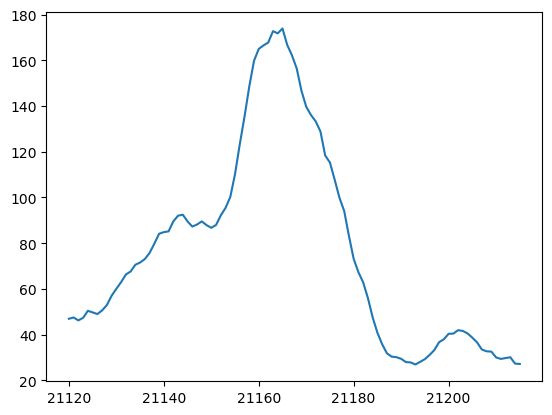

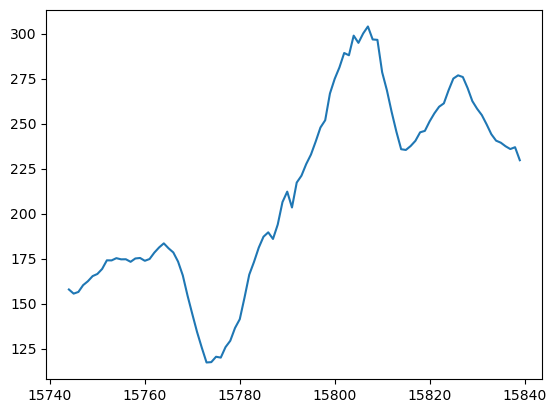

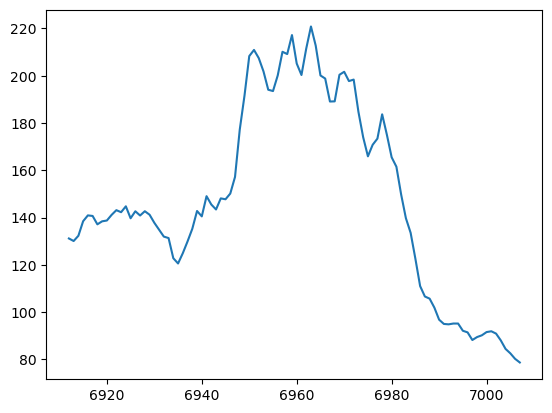

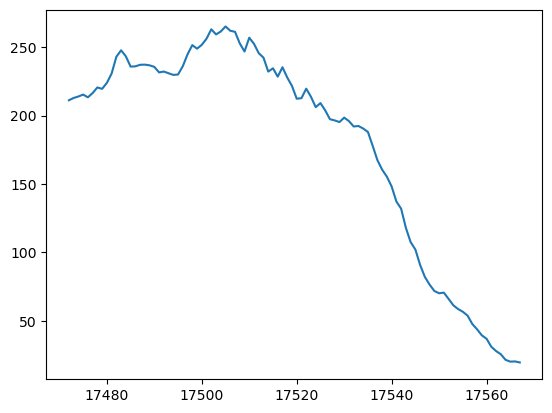

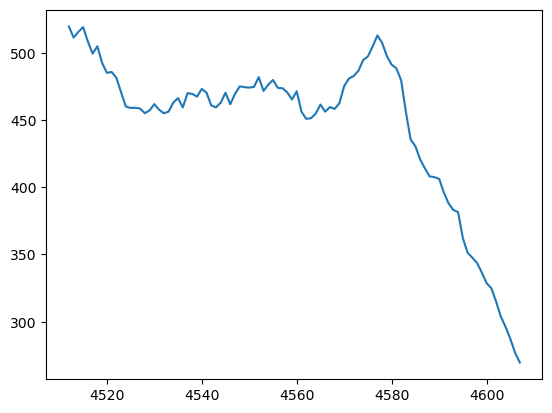

...

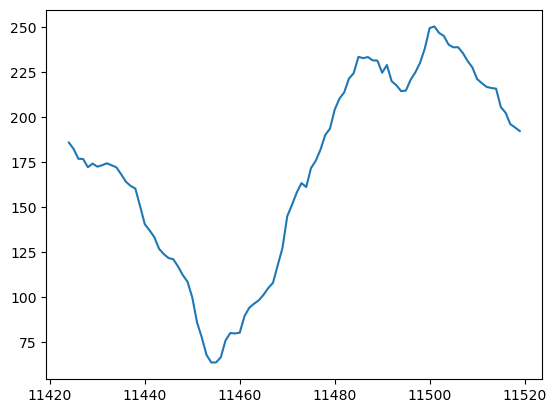

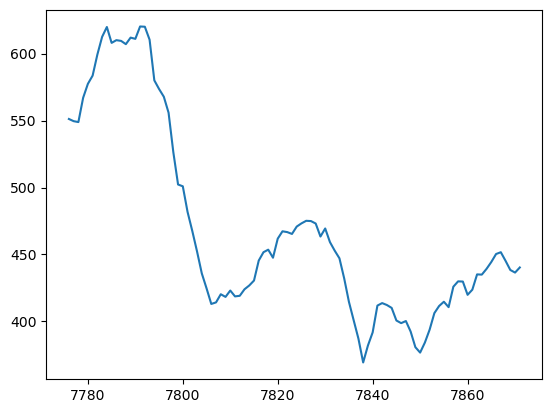

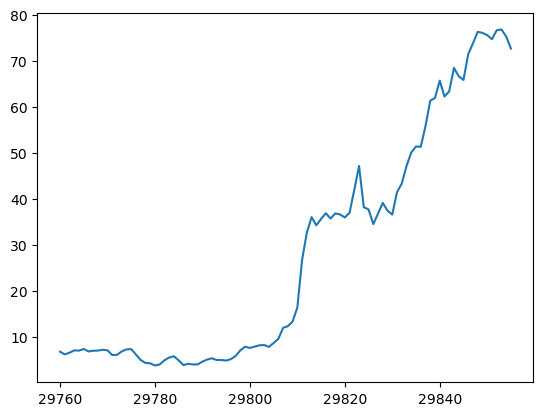

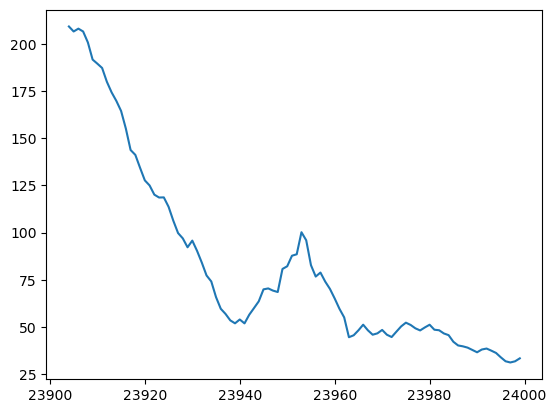

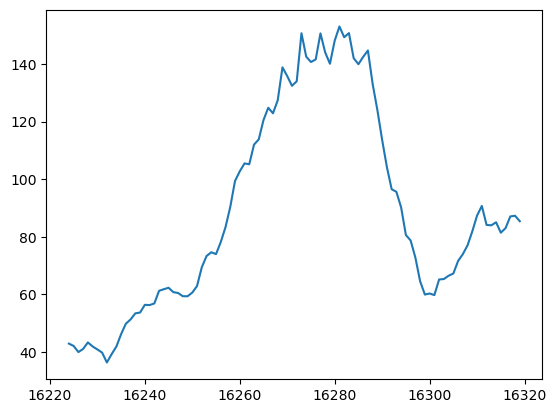

In [40]:
for i in set(DATA['dateTime'].values):
    fig = plt.figure()
    DATA[DATA['dateTime']==i]['TenneTTSO'].plot()


In [2]:
df = pd.read_excel('veu_data.xlsx')
df


,timestamp,wind_speed,active_power
0,2020-06-30 22:00:00,4.078140,0.165642
1,2020-06-30 23:00:00,4.725460,0.138439
2,2020-07-01 00:00:00,5.691820,0.165273
3,2020-07-01 01:00:00,6.046250,0.197691
4,2020-07-01 02:00:00,5.172810,0.152508
...,...,...,...
23236,2023-11-11 19:00:00,6.471040,0.628751
23237,2023-11-11 20:00:00,6.534244,0.722088
23238,2023-11-11 21:00:00,6.968549,0.773255
23239,2023-11-11 22:00:00,6.329801,0.763239


In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from math import ceil

In [9]:
df = df.dropna()
np.corrcoef(df['wind_speed'], df['active_power'])
df = df[(df['wind_speed']>3) & (df['wind_speed']<25)]

In [15]:
max_wind = df['wind_speed'].max()
step = 0.1
num = ceil(max_wind/0.1)
divided = []
sorted_by_speed = df[['timestamp','wind_speed','active_power']].sort_values('wind_speed')
for i in range(1,num):
    divided.append(sorted_by_speed.iloc[((sorted_by_speed['wind_speed']>=i*step)&((sorted_by_speed['wind_speed']<(i+1)*step))).values])
divided = [i for i in divided if not(i.empty) == True]
new_data = pd.DataFrame(columns = ['wind_speed','active_power'])
for i in range(0,len(divided)):
    df1 = divided[i]
    Q1 = df1[['active_power']].quantile(0.05)
    Q3 = df1[['active_power']].quantile(0.75)
    IQR = Q3 - Q1
    divided[i] = df1[~((df1[['active_power']] < (Q1 - IQR)) |(df1[['active_power']] > (Q3 + IQR))).any(axis=1)]

new_data = pd.concat(divided)
new_data.to_csv("veu.csv")

Text(0, 0.5, 'Энергия ВЭС, кВт')

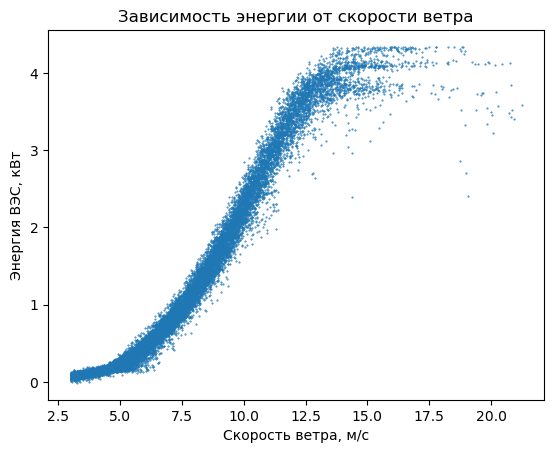

In [14]:
plt.scatter(new_data['wind_speed'], new_data['active_power'], s=0.2 )
plt.title('Зависимость энергии от скорости ветра')
plt.xlabel('Скорость ветра, м/c')
plt.ylabel('Энергия ВЭС, кВт')